## K-Means
*Es un algoritmo de aprendizaje no supervisado utilizado para clustering o agrupamiento de datos. Su objetivo es dividir un conjunto de datos en un número predefinido de grupos o clústeres basados en la similitud de las muestras. Cada clúster está definido por su centroide, que es el punto promedio de todas las muestras dentro de ese clúster*

1. Asignar unos centroides al azar , donde los datos no tengan una tendencia .
Estos centroides , son los futuros centros , luego lo que hace es asignar puntos a esos centroides, se hace por la diferencia minima, entre el centro del centroide y los puntos cercanos.





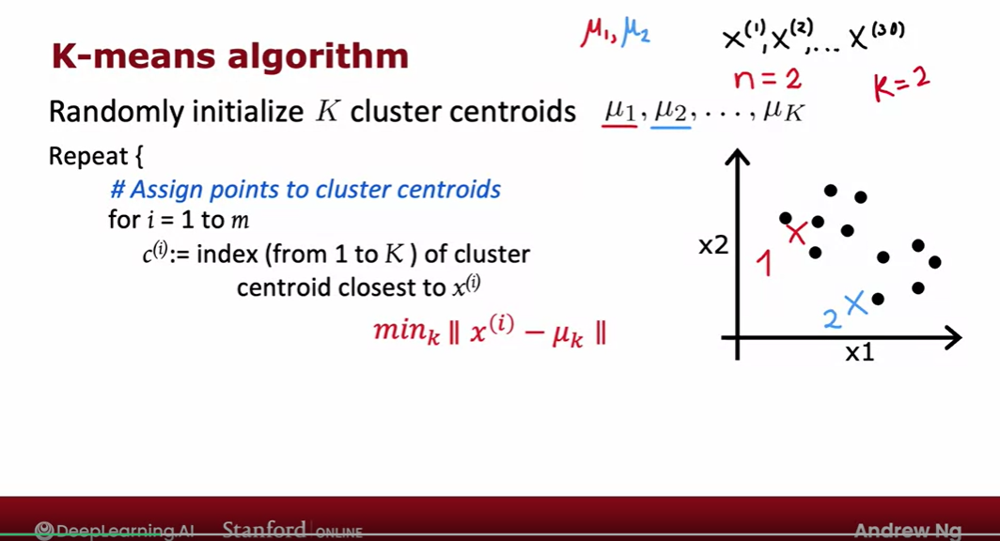

2.el algoritmo mueve los centroides al mejor punto de ubicacion, se desplaza hacia el promedio de los puntos que toma en el cluster. Una vez esta en el punto vuelve y reasigna los puntos al centroide mas cercano . Actualiza hasta que ese promedio no varia mucho por defecto o se puede pasar el parametro.

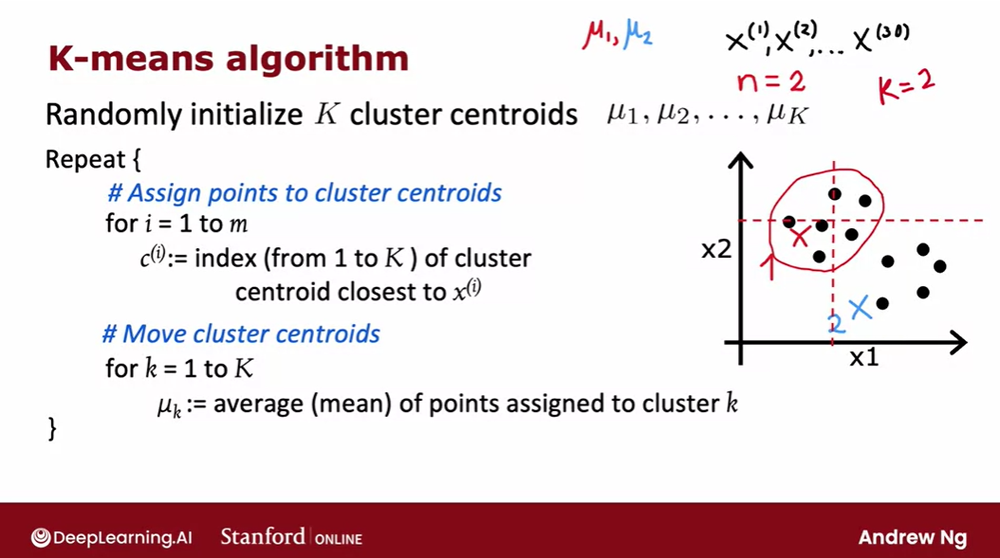

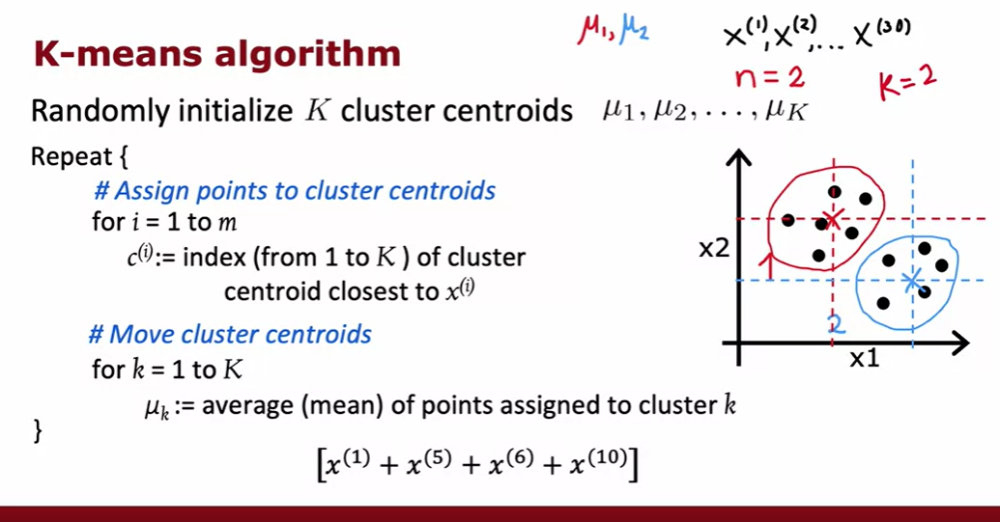

## La funcion de costo es la iteracion de buscar el centroide mas adecuado , es la sumatoria de la distancia cuadratica al los puntos del cluster . Disminuye la distancia minima de los datos al centroide.

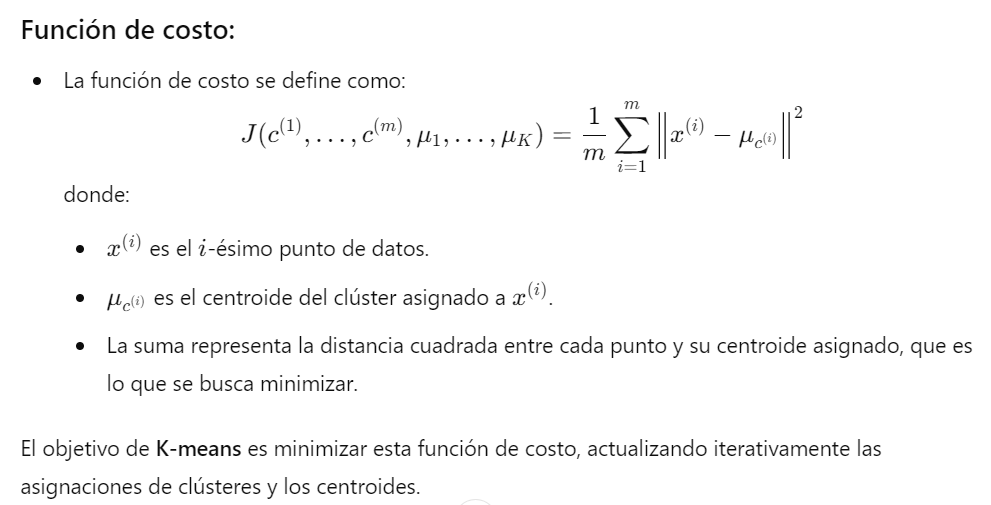



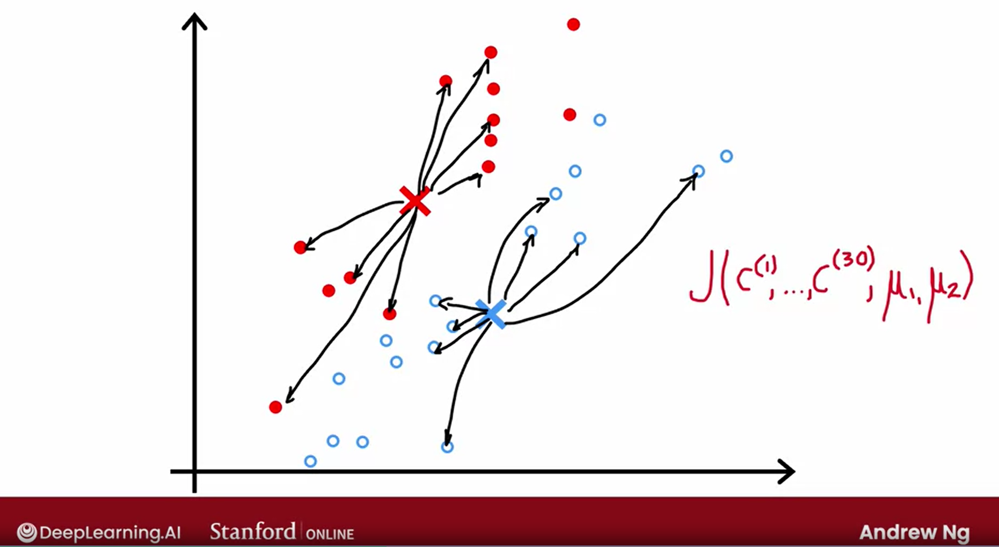

*Cuando selecciono el número de clusters o el centroide ideal, realizo un proceso iterativo. En este proceso, pruebo con diferentes cantidades de clusters, como con uno, dos, tres, cuatro o más, similar a lo que se hace en KNN. Evalúo el rendimiento del modelo con distintas cantidades de clusters (5, 6, etc.), utilizando la métrica apropiada para asegurar que el número de clusters seleccionado sea el más adecuado para los datos.*

Evalúo con qué número de clusters la distancia promedio entre los puntos y sus centroides es más baja, sin aumentar excesivamente el número de clusters para evitar mejoras mínimas en la métrica. Por ejemplo, si entre 5 y 8 clusters no obtengo mejoras significativas, el punto ideal podría ser en torno a 3 clusters, ya que ahí la función de costo está minimizada

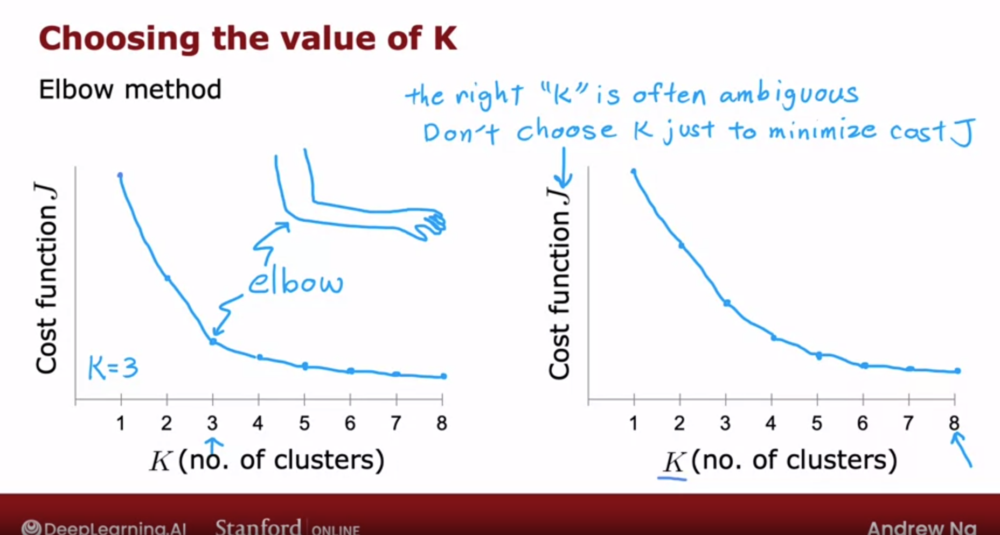

K=3 metodo del codo , Tengo la fucion de costo minimizada pero no hago mas cluster de los necesarios.in embargo, llega un punto donde el descenso en 𝐽
J es menos pronunciado. Este punto se asemeja a un "codo" en la gráfica, lo que indica que agregar más clústeres no mejora significativamente el modelo.No se debe elegir K únicamente para minimizar 𝐽, ya que esto podría llevar a una división excesiva de los datos

Aqui tengo 3 o 5 , puedo agrupar como desee pero si encuentro que por el metodo del codo obtengo una funcion de costo parecida a 5 me quedo con el K:3 (Kmeans puede usarse para compresion de imagenes )

Aplicación de K-means:

K-means puede agrupar estos píxeles en K clústeres. La idea es que cada clúster represente un grupo de píxeles con colores similares.
En lugar de almacenar los colores originales de los píxeles, puedes almacenar solo los centroides de estos clústeres, lo que reduce la cantidad de información necesaria para representar la imagen.

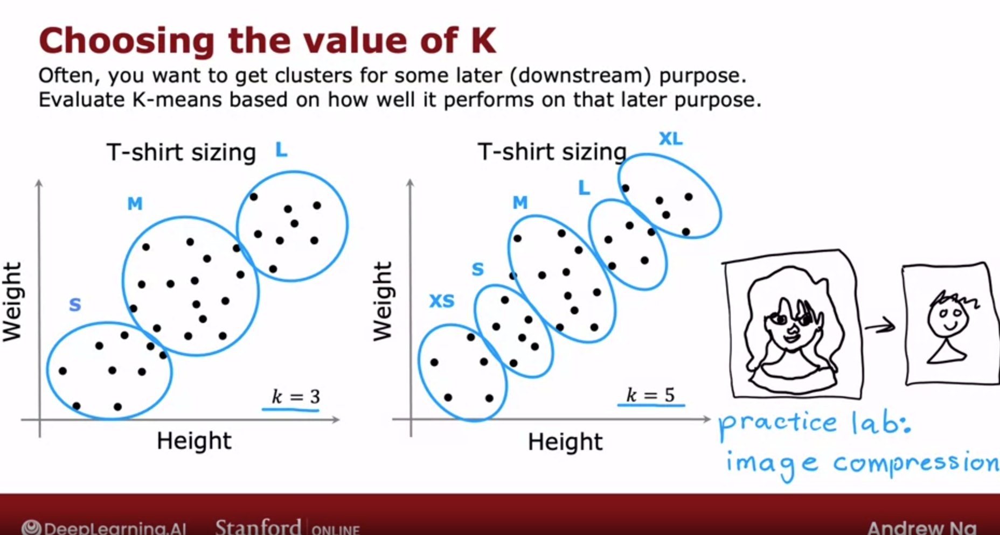

# 1.Algoritmo K-means para Agrupamiento

El algoritmo **K-means** es un algoritmo de agrupamiento no supervisado utilizado para particionar datos en **K** grupos distintos (clusters) basados en sus características. Los puntos de datos en el mismo grupo son más similares entre sí que aquellos en diferentes grupos.

En este notebook, aprenderemos los siguientes conceptos sobre K-means:
1. El concepto básico de K-means.
2. Cómo funciona el algoritmo K-means.
3. Cómo elegir el número óptimo de clusters **K**.
4. Implementación del algoritmo K-means en Python.
5. Visualización de los límites de decisión de los clusters.




## 2.Concepto Básico de K-means

K-means es un algoritmo de agrupamiento que particiona los datos en **K** clusters basándose en la distancia de cada punto de datos al centroide del cluster. El centroide de un cluster es el punto medio de todos los puntos de datos en ese cluster.

El algoritmo K-means funciona iterativamente para asignar cada punto de datos a uno de los K clusters en función de la distancia mínima al centroide. Los centroides de los clusters se actualizan en cada iteración hasta que la asignación de puntos de datos no cambie o hasta que se alcance un número máximo de iteraciones.


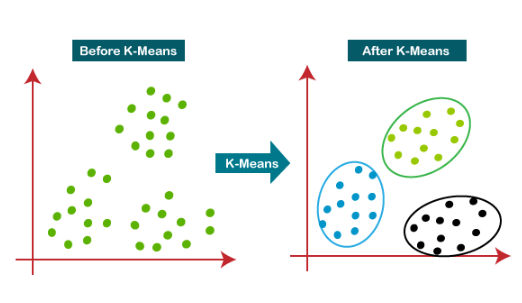

In [1]:
from sklearn.datasets import load_iris
import pandas as pd

# Cargar el conjunto de datos Iris
data = load_iris()
X = data.data  # Características

# Crear un DataFrame para explorar los datos
df = pd.DataFrame(X, columns=data.feature_names)#Se crea un DataFrame de pandas con las características del conjunto de datos Iris. Las columnas se nombran utilizando los nombres de las características (disponibles en data.feature_names).

# Mostrar las primeras filas del conjunto de datos
df.head()


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


## 3. Escalado de Características

Como el algoritmo K-means es sensible a la escala de las características, es importante estandarizar los datos para que todas las características tengan la misma escala. Utilizaremos `StandardScaler` para escalar las características.


In [2]:
from sklearn.preprocessing import StandardScaler

# Estandarizar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)



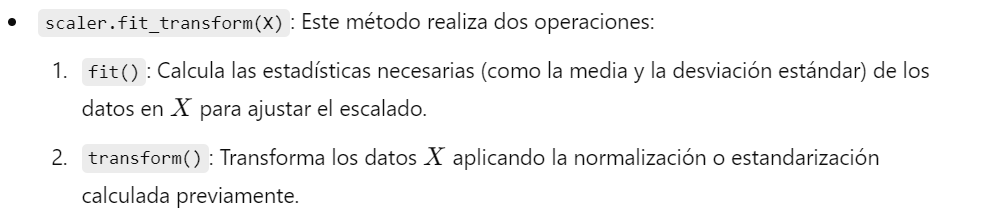

## 4. Implementación del Algoritmo K-means

Implementemos el algoritmo K-means con un número inicial de clusters **K=3**, que es el número real de clases en el conjunto de datos. Luego, visualizaremos los clusters formados.


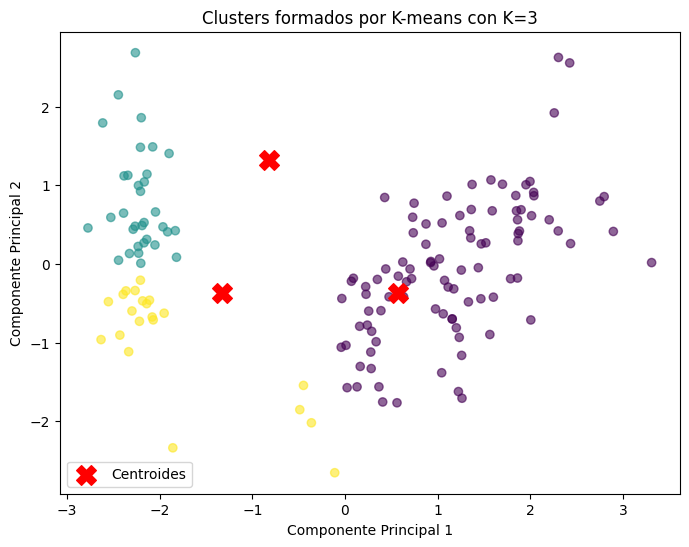

In [3]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Crear un modelo K-means con K=3
kmeans = KMeans(n_clusters=3, random_state=42)# azar queda fijado

# Entrenar el modelo
kmeans.fit(X_scaled)# lo entreno con la data escalada genera los clusters

# Predecir los clusters
y_kmeans = kmeans.predict(X_scaled) # como ya clusterizo pone los datos del dataset en esos cluster

# Visualización de los clusters en 2D utilizando PCA
from sklearn.decomposition import PCA # para ver los datos y bajar la dimensionalidad , el PCA lo hace sobre los datos no sobre el Kmeans

# Reducir a 2 componentes principales para visualización
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Graficar los clusters formados
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_kmeans, cmap='viridis', alpha=0.6) #todas las filas y la columna 0
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='red', marker='X', label='Centroides')
plt.title("Clusters formados por K-means con K=3")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend()
plt.show()


Estoy viendo en 2D como se ven los clusters , tambien es cierto que veo en 2 dimensiones al colapsar a 2 puede que no vea que los cluster se acomodan a los datos.

## 5. Selección del Número Óptimo de Clusters

El método del codo es una técnica popular para encontrar el número óptimo de clusters **K**. Calcula la suma de los errores cuadrados dentro de cada cluster (inercia) para diferentes valores de **K** y elige el valor donde la disminución de la inercia se desacelera significativamente.

Esta funcion de costo se llama inercia : Por que en fisica el momento de inercia calcula es una medida de como la masa de un objeto esta distribuida con respecto a su eje de rotacion y se calcula como la suma de las distancias cuadras de las masas desde el eje y en Kmeas es la suma de las distancias ciadradas e cada punto de datos al centroide del cluster.
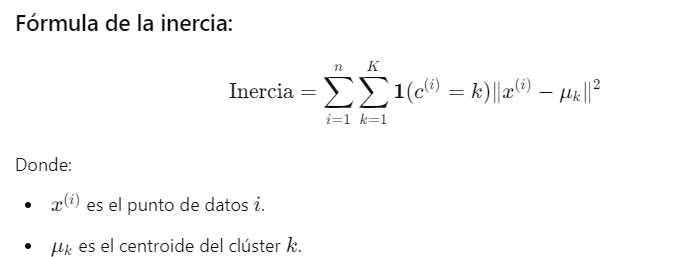
![image.png](
  
)


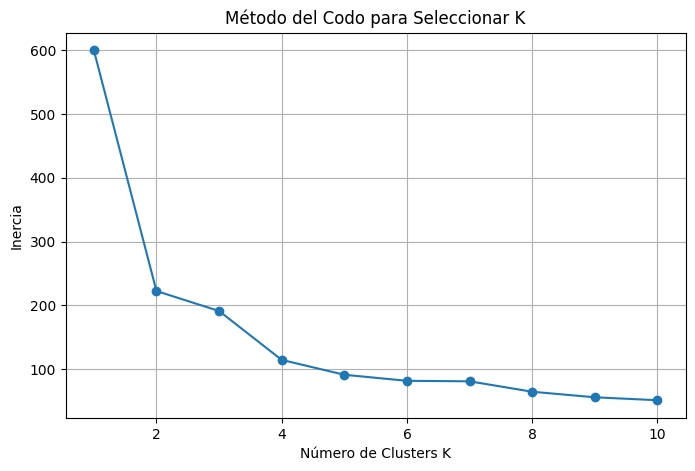

In [7]:
inertias = [] # sumar las funciones de costo para cada K
K_range = range(1, 11)

# Calcular inercia para diferentes valores de K
for k in K_range: # para cada valor haga un Kmeans , hasta 11 , entrenando 11 modelos
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertias, marker='o')
plt.title("Método del Codo para Seleccionar K")
plt.xlabel("Número de Clusters K")
plt.ylabel("Inercia") # grafico como se comporta la inercia para cada cluster
plt.grid(True)
plt.show()


METODO DEL CODO, logre minimizar la inercia son usar muchos K

## 6. Visualización de las Fronteras de Decisión para Diferentes Valores de K

Podemos visualizar cómo cambian las fronteras de decisión de los clusters al cambiar el número de clusters **K**. Utilizaremos la función `plot_decision_regions()` de la biblioteca **mlxtend** para simplificar la visualización.


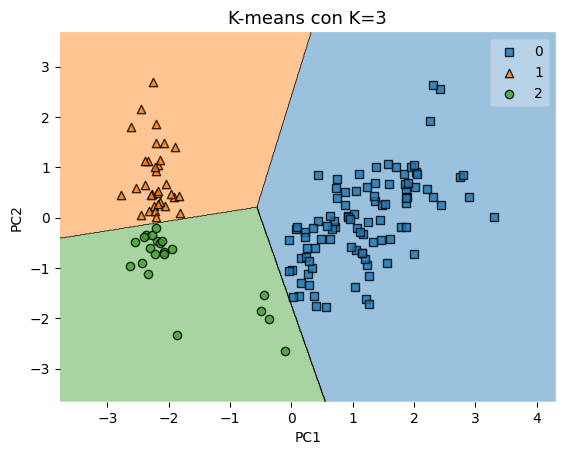

In [8]:
from mlxtend.plotting import plot_decision_regions

def kmeans_decision_boundaries(data, k):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data)

    plot_decision_regions(data, kmeans.labels_, clf=kmeans)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title(f"K-means con K={k}", fontsize=13)
    plt.show()

# Visualización para K=3
kmeans_decision_boundaries(X_pca, 3)


# **Clustering con K-Means**

### **¿Qué es el Clustering?**

Clustering es una técnica utilizada en aprendizaje no supervisado para agrupar puntos de datos similares en función de sus características intrínsecas o similitudes. Su objetivo es identificar patrones o estructuras en los datos sin conocimiento previo de los grupos o etiquetas.

En clustering, los puntos de datos se agrupan en clusters en función de su proximidad en el espacio de características.

**El objetivo es maximizar la similitud dentro de los clusters y minimizar la similitud entre diferentes clusters.**

Los algoritmos de clustering asignan puntos de datos a clusters considerando la similitud o disimilitud entre los atributos de los puntos de datos o las distancias entre ellos.

El clustering se utiliza ampliamente en diversos campos, como minería de datos, reconocimiento de patrones, análisis de imágenes, segmentación de clientes, investigación de mercado y detección de anomalías. Ayuda a descubrir patrones ocultos, entender distribuciones de datos y organizar grandes conjuntos de datos en grupos significativos para un análisis o toma de decisiones posterior.

### **Problema de Negocio**

Has sido asignado como analista de redes sociales responsable de gestionar las cuentas de redes sociales de una empresa. La empresa tiene como objetivo analizar el rendimiento de sus publicaciones en redes sociales y obtener los mejores resultados. Por lo tanto, tú y tu equipo comenzarán a examinar un conjunto de datos que contiene información sobre publicaciones en redes sociales.

Utilizarás el conjunto de datos para analizar el rendimiento de las publicaciones de la empresa. Tu objetivo es comparar las tasas de interacción y compartición de diferentes tipos de publicaciones. De esta manera, pretendes descubrir qué tipos de publicaciones pueden generar más participación y comparticiones para la empresa.

### **Historia de los Datos**

El conjunto de datos contiene características de publicaciones en redes sociales. A continuación se presentan las explicaciones de las variables en el conjunto de datos:

- num_reactions: Número total de reacciones recibidas por la publicación.
  
- num_comments: Número total de comentarios recibidos por la publicación.
  
- num_shares: Número de veces que se ha compartido la publicación.
  
- num_likes: Número de "me gusta" recibidos por la publicación.
  
- num_loves: Número de reacciones "me encanta" recibidas por la publicación.
  
- num_wows: Número de reacciones "me asombra" recibidas por la publicación.
  
- num_hahas: Número de reacciones "me divierte" recibidas por la publicación.
  
- num_sads: Número de reacciones "me entristece" recibidas por la publicación.
  
- num_angrys: Número de reacciones "me enfada" recibidas por la publicación.
  
- status_type_link: 1 si la publicación contiene un enlace, 0 en caso contrario.
  
- status_type_photo: 1 si la publicación contiene una foto, 0 en caso contrario.
  
- status_type_status: 1 si la publicación contiene texto, 0 en caso contrario.
  
- status_type_video: 1 si la publicación contiene un video, 0 en caso contrario.

YA ESTA BINARIZADA


### **Hoja de Ruta**

1) Importar las Librerías Necesarias.

2) Cargar el Conjunto de Datos.

3) Verificar las Columnas del Conjunto de Datos.

4) Crear un Objeto de Modelo.

5) Entrenamiento del Modelo.

6) Predicciones del Modelo.

7) Etiquetas Únicas y sus Contajes.

8) Análisis de Silueta para Diferentes Números de Clusters: Agrupamiento con KMeans.

9) Tipo de Estado Más Frecuente.

10) Conjunto de Datos Combinado con Etiquetas y Tipo de Estado.

11) Contar los Tipos de Estado para Cada Etiqueta.


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

warnings.simplefilter(action="ignore")

In [10]:
#from google.colab import drive
#drive.mount('/content/drive')

path = 'C:\\Users\\Usuario\\Documents\\Curso_Machine_Learning_1\\Datos\\'

filename = 'Live.csv'

In [11]:
df = pd.read_csv(f"{path}{filename}")


In [12]:
df.info() #Estructura del dataset, este comando dice tipos de columnas, nombres de columnas, ctamaño del  dataset en memoria y número de entradas o filas (7049)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7050 entries, 0 to 7049
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   status_id         7050 non-null   object 
 1   status_type       7050 non-null   object 
 2   status_published  7050 non-null   object 
 3   num_reactions     7050 non-null   int64  
 4   num_comments      7050 non-null   int64  
 5   num_shares        7050 non-null   int64  
 6   num_likes         7050 non-null   int64  
 7   num_loves         7050 non-null   int64  
 8   num_wows          7050 non-null   int64  
 9   num_hahas         7050 non-null   int64  
 10  num_sads          7050 non-null   int64  
 11  num_angrys        7050 non-null   int64  
 12  Column1           0 non-null      float64
 13  Column2           0 non-null      float64
 14  Column3           0 non-null      float64
 15  Column4           0 non-null      float64
dtypes: float64(4), int64(9), object(3)
memory 

In [13]:
df.head() #cheqeuamos la estructura del dataset , se debe preprocesar  Tiene variables categorias como id, la fecha podriamos quitarla al igual que el status


,status_id,status_type,status_published,num_reactions,num_comments,num_shares,num_likes,num_loves,num_wows,num_hahas,num_sads,num_angrys,Column1,Column2,Column3,Column4
0,246675545449582_1649696485147474,video,4/22/2018 6:00,529,512,262,432,92,3,1,1,0,NaN,NaN,NaN,NaN
1,246675545449582_1649426988507757,photo,4/21/2018 22:45,150,0,0,150,0,0,0,0,0,NaN,NaN,NaN,NaN
2,246675545449582_1648730588577397,video,4/21/2018 6:17,227,236,57,204,21,1,1,0,0,NaN,NaN,NaN,NaN
3,246675545449582_1648576705259452,photo,4/21/2018 2:29,111,0,0,111,0,0,0,0,0,NaN,NaN,NaN,NaN
4,246675545449582_1645700502213739,photo,4/18/2018 3:22,213,0,0,204,9,0,0,0,0,NaN,NaN,NaN,NaN


Cuando se observa el dataset , se observa que es una base de datos con etiquetas, asi que puede eliminarlas para generar un aprendizaje automatico no supervisado. Por medio de los clusters

In [14]:
df.describe() #Reporte estadístico de las variables numéricas el data ya procesado

,num_reactions,num_comments,num_shares,num_likes,num_loves,num_wows,num_hahas,num_sads,num_angrys,Column1,Column2,Column3,Column4
count,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,0.0,0.0,0.0,0.0
mean,230.117163,224.356028,40.022553,215.043121,12.728652,1.289362,0.696454,0.243688,0.113191,NaN,NaN,NaN,NaN
std,462.625309,889.636820,131.599965,449.472357,39.972930,8.719650,3.957183,1.597156,0.726812,NaN,NaN,NaN,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
25%,17.000000,0.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
50%,59.500000,4.000000,0.000000,58.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
75%,219.000000,23.000000,4.000000,184.750000,3.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
max,4710.000000,20990.000000,3424.000000,4710.000000,657.000000,278.000000,157.000000,51.000000,31.000000,NaN,NaN,NaN,NaN


In [15]:
df.status_type.value_counts() #EDA , Categorías de la variable categórica status_type: Que habla del tipo de publiación...la mayoría de publicaciones en el dataset son Fotos.

status_type
photo     4288
video     2334
status     365
link        63
Name: count, dtype: int64

 El término EDA se refiere a Exploratory Data Analysis (Análisis Exploratorio de Datos). Es una fase crítica en el análisis de un conjunto de datos (dataset) que se realiza antes de aplicar modelos de aprendizaje automático o tomar decisiones. El objetivo de un EDA es entender mejor los datos, encontrar patrones, detectar anomalías, verificar supuestos y resumir las principales características de los datos, a menudo mediante gráficos y estadísticas.

### ATENCIÓN a estos recuentos de tipos de publicacones en redes sociales. El clustering más adelante las retoma de manera automática o NO SUPERVISADA

uso el dataset ya limpio Live_processed

In [22]:
# Cargamos una versión procesada del dataset dónde ya se hizo escalada, eliminación y otros cambios, También se hizo ONE HOT enconding a la variable de status type

path = 'C:\\Users\\Usuario\\Documents\\Curso_Machine_Learning_1\\Datos\\'

filename = 'Live_processed .csv'

In [23]:
df = pd.read_csv(f"{path}{filename}")

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\Usuario\\Documents\\Curso_Machine_Learning_1\\Datos\\Live_processed .csv'

In [297]:
df.head()

,num_reactions,num_comments,num_shares,num_likes,num_loves,num_wows,num_hahas,num_sads,num_angrys,status_type_link,status_type_photo,status_type_status,status_type_video
0,0.112314,0.024393,0.076519,0.091720,0.140030,0.010791,0.006369,0.019608,0.0,0.0,0.0,0.0,1.0
1,0.031847,0.000000,0.000000,0.031847,0.000000,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0
2,0.048195,0.011243,0.016647,0.043312,0.031963,0.003597,0.006369,0.000000,0.0,0.0,0.0,0.0,1.0
3,0.023567,0.000000,0.000000,0.023567,0.000000,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0
4,0.045223,0.000000,0.000000,0.043312,0.013699,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0


In [298]:
from google.colab import sheets
sheet = sheets.InteractiveSheet(df=df)

https://docs.google.com/spreadsheets/d/1lQEOzqEyEu2HBQv9WvUEl9a-yGXNhlf16rbgq95YHe0#gid=0


### Instanciamos un modelo de KMeans  (Previamente importado desde Scikit learn cluster)

In [299]:
model = KMeans(n_clusters=4)  # si le aplico al modelo un dataset que esta sin filtrar va a generar errores

### Entrenamos el modelo con la data de entrenamiento

In [300]:
model.fit(df)

KMeans(n_clusters=4)

### **Generamos los labels o etiquetas al predecir con el mismo dataset que entrenamos nuestro modelo de K-Means.  Labels sería equivalente a decir los grupos o clusters de datos que el algoritmo ha encontrado de manera NO supervisada, es decir, yo no le dije al algoritmo a que grupo pertenecian los datos!!**

##tenga en Cuenta esta metrica : El índice de silueta o score de silueta es una métrica utilizada para evaluar la calidad de los clústeres generados por algoritmos de clustering, como K-means. Este índice mide qué tan cerca están los puntos dentro de un mismo clúster y qué tan separados están los clústeres entre sí. Un valor más alto indica que los clústeres están bien definidos

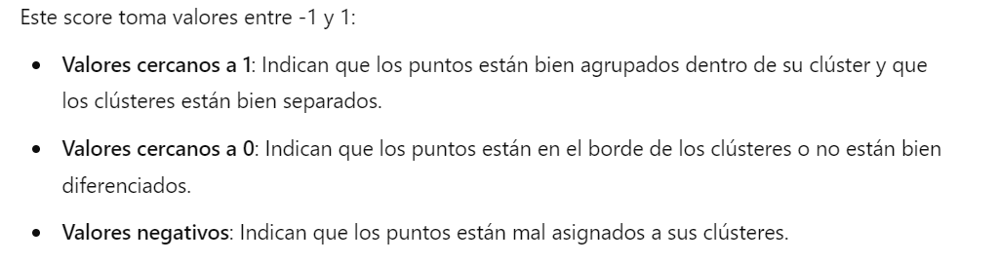

In [301]:
labels = model.predict(df) # ya que conoce los datos , diga que etiqueta pertenece

In [302]:
np.unique(labels, return_counts=True) #ESTE es un value_counts() hecho a un numpy array, para saber cuantas etiquetas tengo ( puede que no me de exacto pero si muy aprox)

(array([0, 1, 2, 3], dtype=int32), array([4288, 2334,  365,   63]))

For n_clusters=2, The Silhouette Coefficient is 0.8100521348183237
For n_clusters=3, The Silhouette Coefficient is 0.8972493682244883
For n_clusters=4, The Silhouette Coefficient is 0.9106664962327088
For n_clusters=5, The Silhouette Coefficient is 0.8663537357009089
For n_clusters=6, The Silhouette Coefficient is 0.8177773060306065
For n_clusters=7, The Silhouette Coefficient is 0.7725503673549151
For n_clusters=8, The Silhouette Coefficient is 0.7755551937144504
For n_clusters=9, The Silhouette Coefficient is 0.7319956440281179
For n_clusters=10, The Silhouette Coefficient is 0.7628457869830627
For n_clusters=11, The Silhouette Coefficient is 0.7310875873730417


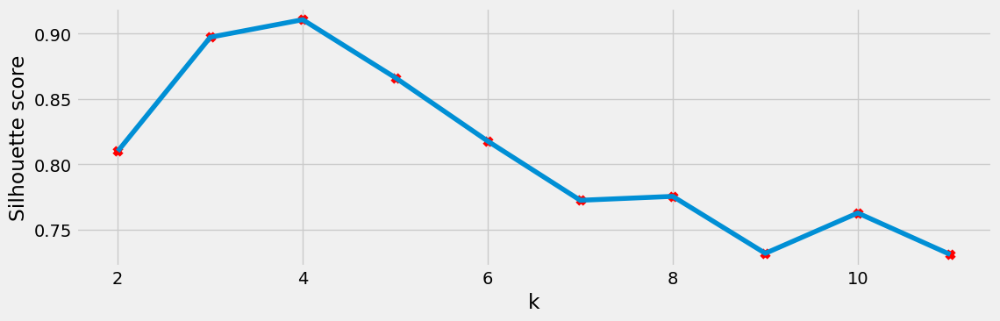

In [303]:
silhouettes = [] # lista vacia
ks = list(range(2, 12))# numero de cluster
for n_cluster in ks:
    kmeans = KMeans(n_clusters=n_cluster).fit(df) #  agrupar datos en clústeres fit(df): Ajusta el modelo K-Means a los datos en el DataFrame df. df debe contener las variables con las que se va a realizar el agrupamiento.
    label = kmeans.labels_
    sil_coeff = silhouette_score(df, label, metric='euclidean') #Después de la inercia lo más utilizado es el score de Silueta.
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))
    silhouettes.append(sil_coeff)

plt.figure(figsize=(12, 8))
plt.subplot(211)
plt.scatter(ks, silhouettes, marker='x', c='r')
plt.plot(ks, silhouettes)
plt.xlabel('k')
plt.ylabel('Silhouette score');

La maxima Homogeneidad la encuentro en 4

In [304]:
#Convierte el arreglo escalado de nuevo a un DataFrame para facilitar el análisis.
df = pd.DataFrame(df, columns=df.columns)
df['labels'] = labels  # Le añado las etiquetas a los cluster

In [305]:
status_type = df[["status_type_photo", "status_type_video", "status_type_status"]].idxmax(axis=1)

In [306]:
df = pd.concat([df["labels"],status_type.rename("status_type")], axis=1)

In [307]:
df.groupby(["labels","status_type"])["status_type"].count()

,,status_type
labels,status_type,
0,status_type_photo,4288
1,status_type_video,2334
2,status_type_status,365
3,status_type_photo,63


## EJERCICIO PARA SEGMENTACION DE CLIENTES, SU USO MAS FRECUENTE BANCOS , COMO MANEJAN SUS PRODUCTOR PARA SABER QUE PUEDEN OFRECERLES - ANALISIS DEL COMPORTAMIENTO

In [308]:
import pandas as pd

In [309]:
from google.colab import drive
drive.mount('/content/drive')

path = '/content/drive/MyDrive/Colab Notebooks/notebooks ML1/'

filename = 'Customer_Data.csv'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [310]:
df = pd.read_csv(f"{path}{filename}")

In [311]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.offline as offline
offline.init_notebook_mode()

import warnings
warnings.filterwarnings ("ignore")

In [312]:
print ("Shape of data: {}" . format (df.shape))
print ("Number of rows: {}" . format (df.shape [0]))
print ("Number of columns: {}" . format (df.shape [1]))

Shape of data: (8950, 18)
Number of rows: 8950
Number of columns: 18


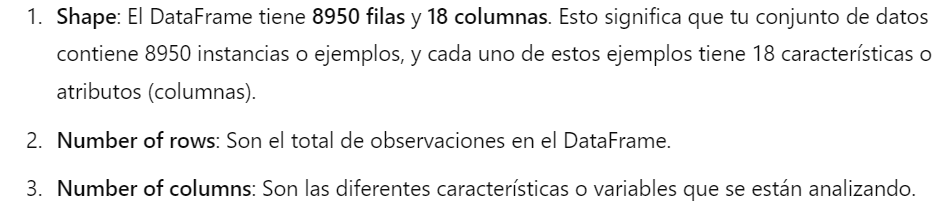

In [313]:
df.describe (include = "all").T # data de tarjeta de credito , frecuencia de compras , sacar dinero por cajero ( para saber que producor le ofrecen)

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CUST_ID,8950,8950,C10001,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BALANCE,8950.0,NaN,NaN,NaN,1564.474828,2081.531879,0.0,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,NaN,NaN,NaN,0.877271,0.236904,0.0,0.888889,1.0,1.0,1.0
PURCHASES,8950.0,NaN,NaN,NaN,1003.204834,2136.634782,0.0,39.635,361.28,1110.13,49039.57
ONE_OFF_PURCHASES,8950.0,NaN,NaN,NaN,592.437371,1659.887917,0.0,0.0,38.0,577.405,40761.25
INSTALLMENTS_PURCHASES,8950.0,NaN,NaN,NaN,411.067645,904.338115,0.0,0.0,89.0,468.6375,22500.0
CASH_ADVANCE,8950.0,NaN,NaN,NaN,978.871112,2097.163877,0.0,0.0,0.0,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,NaN,NaN,NaN,0.490351,0.401371,0.0,0.083333,0.5,0.916667,1.0
ONE_OFF_PURCHASES_FREQUENCY,8950.0,NaN,NaN,NaN,0.202458,0.298336,0.0,0.0,0.083333,0.3,1.0
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,NaN,NaN,NaN,0.364437,0.397448,0.0,0.0,0.166667,0.75,1.0


In [314]:
print ("Duplicate values in df are:" , df.duplicated ().sum ())

Duplicate values in df are: 0


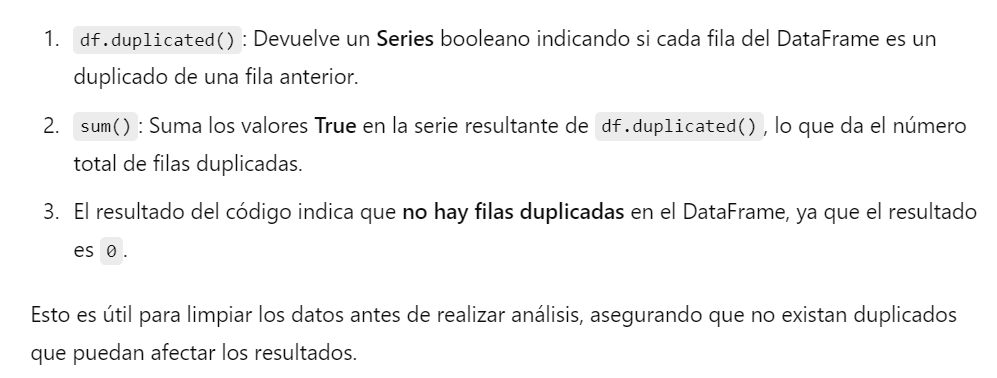

In [315]:
df1 = df.copy () # para no alterar los datos, copia de dataframe

In [316]:
df2 = df.copy()

In [317]:
# Function to capitalize column names
df1.columns = [col.title() for col in df1.columns] # capitalizar las preguntas Capitaliza el nombre de la columna, es decir, convierte la primera letra de cada palabra en mayúscula y el resto en minúscula

In [318]:
Minimum_Payments = df1 ["Minimum_Payments"] #estinado a manejar valores faltantes (NaN) en la columna Minimum_Payments del DataFrame df1 de una manera específica,
i = 0
for payments, minimum_payments in zip (df1 ["Payments"] , df1 ["Minimum_Payments"].isna()):
    if (payments == 0) and (minimum_payments == True):
        Minimum_Payments [i] = 0
    elif (payments > 0) and (minimum_payments == True):
        Minimum_Payments [i] = Minimum_Payments [i]
    i += 1

df1 ["Minimum_Payments"] = Minimum_Payments

In [319]:
df_2 = (df1 [df1 ["Minimum_Payments"].isna() == True]) #Este tipo de filtrado puede ser útil para manejar o investigar valores faltantes y realizar operaciones de limpieza o imputación en función de condiciones específicas.
df_3 = (df_2 [df_2 ["Payments"] == 0])
df_3

,Cust_Id,Balance,Balance_Frequency,Purchases,One_Off_Purchases,Installments_Purchases,Cash_Advance,Purchases_Frequency,One_Off_Purchases_Frequency,Purchases_Installments_Frequency,Cash_Advance_Frequency,Cash_Advance_Trx,Purchases_Trx,Credit_Limit,Payments,Minimum_Payments,Prc_Full_Payment,Tenure


In [320]:
df.columns = [i.title() for i in df2.columns] #código que está modificando los nombres de las columnas de un DataFrame llamado df utilizando una list comprehension para capitalizar cada uno de los nombres de las columnas
df.columns

Index(['Cust_Id', 'Balance', 'Balance_Frequency', 'Purchases',
       'One_Off_Purchases', 'Installments_Purchases', 'Cash_Advance',
       'Purchases_Frequency', 'One_Off_Purchases_Frequency',
       'Purchases_Installments_Frequency', 'Cash_Advance_Frequency',
       'Cash_Advance_Trx', 'Purchases_Trx', 'Credit_Limit', 'Payments',
       'Minimum_Payments', 'Prc_Full_Payment', 'Tenure'],
      dtype='object')

In [321]:
Missing_values_percentange = 100 * df1["Credit_Limit"].isnull().sum()/len(df1)
print ("Missing values percentange for 'Credit_Limit' is:" , Missing_values_percentange)
Missing_values_percentange = 100 * df1["Minimum_Payments"].isnull().sum()/len(df1)
print ("Missing values percentange for 'Minimum_Payments' is:" , Missing_values_percentange) #calculando el porcentaje de valores faltantes (NaN) en dos columnas del DataFrame El resultado indica que no hay valores faltantes en ninguna de estas dos columnas.

Missing values percentange for 'Credit_Limit' is: 0.0111731843575419
Missing values percentange for 'Minimum_Payments' is: 0.8156424581005587


In [322]:
df1.dropna (inplace = True)#método dropna() de pandas para eliminar filas con valores faltantes (NaN) en el DataFrame df1.

In [323]:
df1.isnull ().sum () # DATOS FALTANTES

,0
Cust_Id,0
Balance,0
Balance_Frequency,0
Purchases,0
One_Off_Purchases,0
Installments_Purchases,0
Cash_Advance,0
Purchases_Frequency,0
One_Off_Purchases_Frequency,0
Purchases_Installments_Frequency,0


In [324]:
print (df1 ['Tenure'].unique ())

[12  8 11  9 10  6  7]


In [325]:
df1.drop (['Cust_Id'], axis=1, inplace = True)

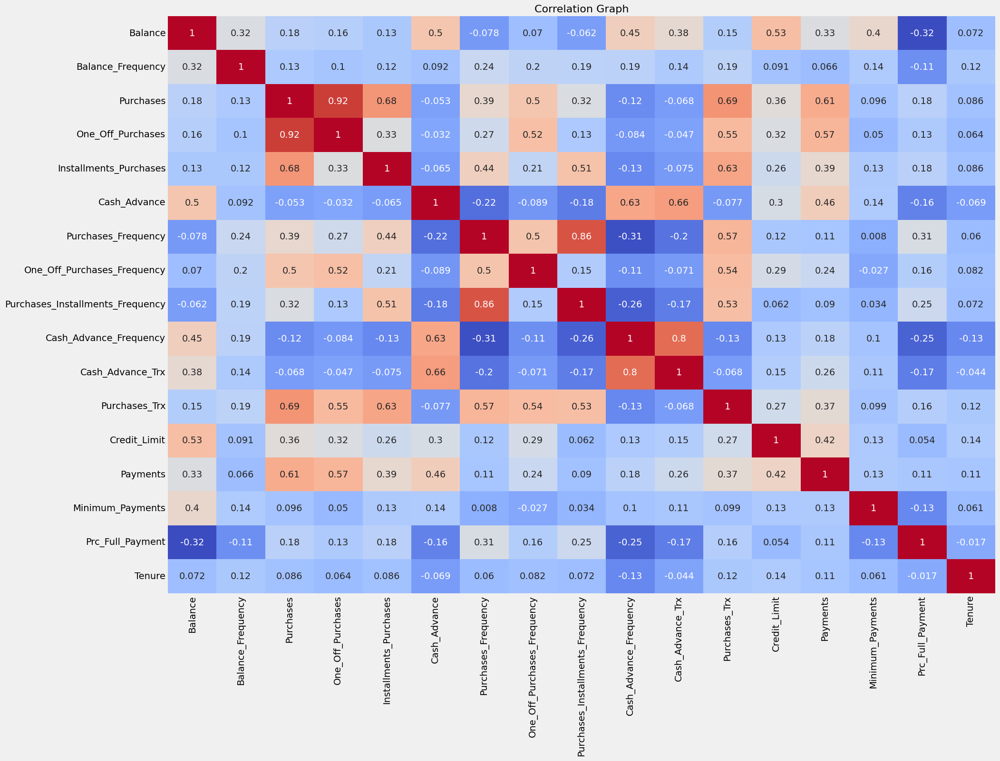

In [326]:
plt.figure (figsize = [20,15] ,  dpi = 100 )
plt.title ("Correlation Graph" , fontsize = 16)
sns.heatmap (df1.corr(), annot = True, cmap = 'coolwarm', cbar = False)
plt.show ()

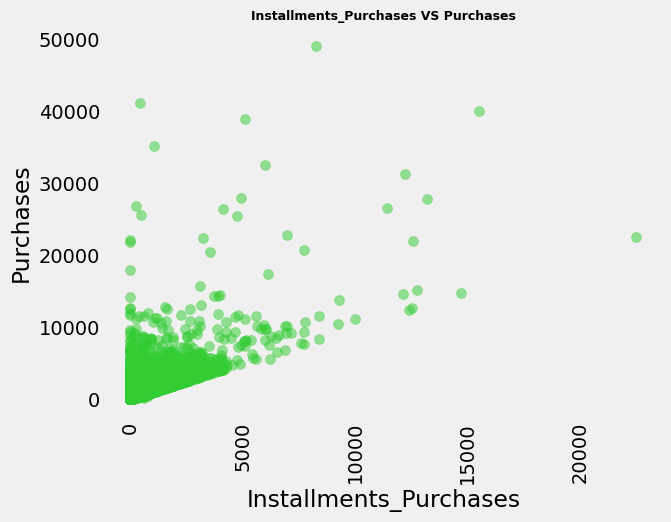

In [327]:
plt.scatter (df1["Installments_Purchases"] , df1["Purchases"] ,color = "LimeGreen" , s = 50, alpha = 0.5)
plt.xticks (rotation = 90)
plt.title ("Installments_Purchases VS Purchases" , weight = "bold" , color = "black" , fontsize = 9)
plt.xlabel ("Installments_Purchases"  , color = "black") #X, representa las compras a cuotas
plt.ylabel ("Purchases" , color = "black") # Representa el valor total de las compras realizadas (incluyendo todos los tipos de compras).
plt.grid ()
plt.show () # se pueden ver correlaciones de todo tipo

Interpretación del gráfico:
Relación general entre las variables:

Este tipo de gráfico te permite visualizar si existe alguna correlación entre las dos variables. En este caso, al observar los puntos en el gráfico, vemos que muchos puntos están concentrados en los valores bajos (cerca de cero), lo que podría indicar que hay muchas instancias con compras a plazos pequeñas o sin compras.
En términos generales, se observa que a medida que aumentan las compras a plazos (Installments_Purchases en el eje X), también tienden a aumentar las compras totales (Purchases en el eje Y). Esto sugiere una correlación positiva, donde un aumento en las compras a plazos se asocia con un aumento en el total de compras.
Distribución de los datos:

Concentración de puntos: La mayoría de los puntos están agrupados cerca del origen (valores bajos de Installments_Purchases y Purchases), lo que indica que la mayoría de las personas o casos tienen compras a plazos y totales relativamente bajas.
Puntos dispersos: Hay algunos puntos que se encuentran más dispersos en la parte superior derecha del gráfico, lo que sugiere que algunas personas tienen compras más altas tanto a plazos como en total. Estos puntos son menos comunes, pero pueden representar clientes o casos especiales con gastos significativamente mayores.
Correlaciones visibles:

Posibles correlaciones: Como puedes observar, parece haber una tendencia general en la que si una persona tiene compras más grandes a plazos, probablemente también tenga un mayor valor total de compras. Esta correlación puede ser útil para realizar inferencias sobre el comportamiento de los consumidores.
Sin embargo, la dispersión de los puntos no sugiere una correlación lineal fuerte (es decir, no todos los puntos siguen una línea recta), lo que indica que hay otros factores que influyen en la relación entre estas variables.

In [328]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler () # siempre tengo que escalar pero aqui si es primordial
scaled_features = scaler.fit_transform (df1)

In [329]:
from sklearn.cluster import KMeans

kmeans_set = {"init": "random", "n_init": 10, "max_iter": 300, "random_state": 42} # el numero de veces que puede iniciar los clusters o reasignar los centroides , y el max_iter es cuantas veces puede reiniciar , calcular la inercia y volver a repetir

List = []
for k in range (1, 11):
    kmeans = KMeans (n_clusters = k, **kmeans_set) # ** opens the dictionary
    kmeans.fit (scaled_features)
    List.append (kmeans.inertia_)

In [330]:
!pip install kneed

In [331]:
from kneed import KneeLocator # para hacer el metodo del codo
k1 = KneeLocator (range (1, 11), List, curve = "convex", direction = "decreasing")
k1.elbow

4

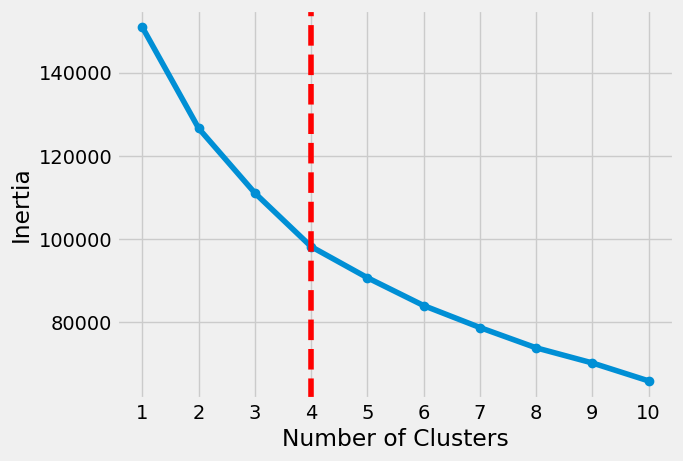

In [332]:
plt.style.use ("fivethirtyeight")
plt.plot (range (1,11), List , marker = 'o')
plt.xticks (range (1, 11))
plt.xlabel ("Number of Clusters")
plt.ylabel ("Inertia")
# axvline = ax vertical line
plt.axvline (x = k1.elbow, color = "red", label = "axvline - full height",linewidth = 4, linestyle ="--")
plt.show ()

In [333]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score # metrica de homogeneidad

silhouette_coefficients = []
for k in range (2, 11): # # numero de clusters
    kmeans = KMeans (n_clusters = k, **kmeans_set)
    kmeans.fit (scaled_features)
    score = silhouette_score (scaled_features, kmeans.labels_)
    silhouette_coefficients.append (score)

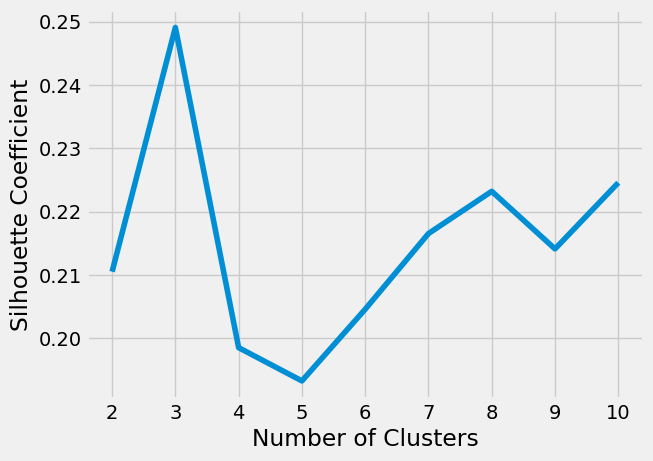

In [334]:
# Plotting the results:
plt.style.use ("fivethirtyeight")
plt.plot (range (2, 11), silhouette_coefficients)
plt.xticks (range (2, 11))
plt.xlabel ("Number of Clusters")
plt.ylabel ("Silhouette Coefficient")#Clústeres generados por un algoritmo de clustering, valores que van de -1 a 1. Un valor cercano a 1 indica que los puntos están bien agrupados y claramente separados de otros clústeres, mientras que un valor cercano a -1 indica que los puntos están mal clasificados.
plt.show ()

##Observaciones:

1.El valor más alto del coeficiente de silueta se encuentra cuando hay 3 clústeres (aproximadamente 0.25), lo que sugiere que el agrupamiento es más "coherente" o "compacto" en esta configuración.

2.A medida que aumenta el número de clústeres, el coeficiente de silueta disminuye de forma significativa después de 3 clústeres, alcanzando un valor más bajo en 5 clústeres.

3.Después de 5 clústeres, los valores del coeficiente de silueta aumentan gradualmente, pero no alcanzan el valor máximo obtenido con 3 clústeres.

In [335]:
from sklearn.cluster import KMeans
kmeans = KMeans (n_clusters = 3)# Se inicializa el algoritmo K-Means para agrupar los datos en 3 clústeres..
kmeans = kmeans.fit (df1)#Se ajusta el modelo K-Means a los datos contenidos en el DataFrame df1.

centroids = kmeans.cluster_centers_#Se obtienen los centroides de los 3 clústeres.
print (centroids)

labels = kmeans.labels_
print (labels)

[[3.43338315e+03 9.42007912e-01 1.58865914e+03 9.92048201e+02
  5.96929000e+02 2.14071384e+03 5.39791414e-01 3.17755151e-01
  3.85381514e-01 2.12658623e-01 5.78853843e+00 2.22243447e+01
  9.05637696e+03 2.91506218e+03 1.56919945e+03 1.33107749e-01
  1.17347845e+01]
 [8.68800442e+02 8.62483204e-01 6.12488825e+02 3.18774755e+02
  2.94014052e+02 5.03351794e+02 4.67816173e-01 1.56354597e-01
  3.51379814e-01 1.07802199e-01 2.28463670e+00 1.07704741e+01
  2.77057783e+03 1.00414939e+03 5.55077515e+02 1.58965352e-01
  1.14381158e+01]
 [4.87916214e+03 9.17611326e-01 1.08536936e+04 7.65950163e+03
  3.19436248e+03 5.19215982e+03 7.57564000e-01 6.03537062e-01
  6.08805682e-01 2.28296233e-01 9.27131783e+00 8.68604651e+01
  1.24848837e+04 1.80309572e+04 2.52779839e+03 3.37066930e-01
  1.18372093e+01]]
[1 0 0 ... 1 1 1]


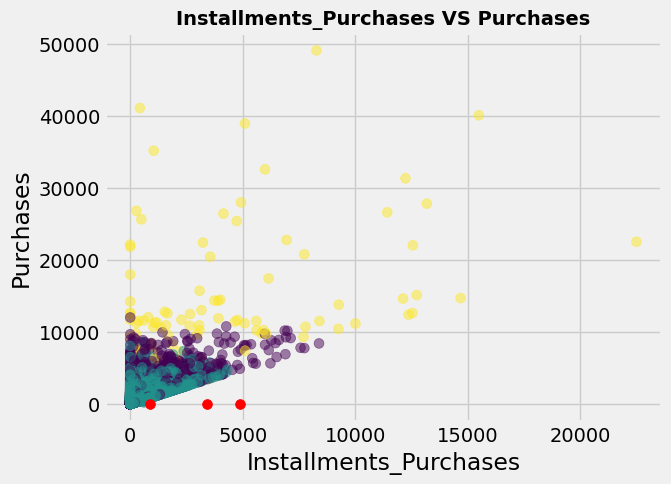

In [336]:
plt.scatter (df1["Installments_Purchases"] , df1["Purchases"] , c = kmeans.labels_.astype (float), s = 50, alpha = 0.5)
plt.scatter (centroids [:, 0], centroids [:, 1], c = "red", s = 50)
plt.title ("Installments_Purchases VS Purchases" , weight = "bold" , color = "black" , fontsize = 14)
plt.xlabel ("Installments_Purchases"  , color = "black")
plt.ylabel ("Purchases" , color = "black")
plt.grid (True)
plt.show ()

Este gráfico muestra cómo el algoritmo K-Means ha agrupado los datos en 3 clústeres basándose en las compras a plazos y las compras totales. Los centroides de cada clúster indican el "centro" de los grupos, y los colores muestran a qué clúster pertenece cada punto.

Es un ejemplo de cómo utilizar el clustering para detectar patrones en el comportamiento de compra de los clientes.

In [337]:
df2 = df1.copy ()
df2 ["Labels"] = kmeans.labels_ # DataFrame (df2) que es una copia de df1, pero con una nueva columna llamada Labels que contiene los resultados de una clasificación realizada por el algoritmo K-means. Esta columna Labels contiene las etiquetas asignadas por el algoritmo, indicando a qué clúster pertenece cada fila de datos.
df2

,Balance,Balance_Frequency,Purchases,One_Off_Purchases,Installments_Purchases,Cash_Advance,Purchases_Frequency,One_Off_Purchases_Frequency,Purchases_Installments_Frequency,Cash_Advance_Frequency,Cash_Advance_Trx,Purchases_Trx,Credit_Limit,Payments,Minimum_Payments,Prc_Full_Payment,Tenure,Labels
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,0
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,193.571722,0.833333,1012.73,1012.73,0.00,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,0.000000,0.000000,6,1
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,1
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,1
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


In [338]:
cluster = kmeans.labels_#Los números 0, 1, etc. son las etiquetas asignadas por el modelo K-means a cada observación en tu conjunto de datos. Estas etiquetas agrupan los datos en clústeres que comparten características similares.
print (cluster)

[1 0 0 ... 1 1 1]


In [339]:
df2.Labels.value_counts ()

,count
Labels,
1,6488
0,2259
2,129


<Axes: ylabel='count'>

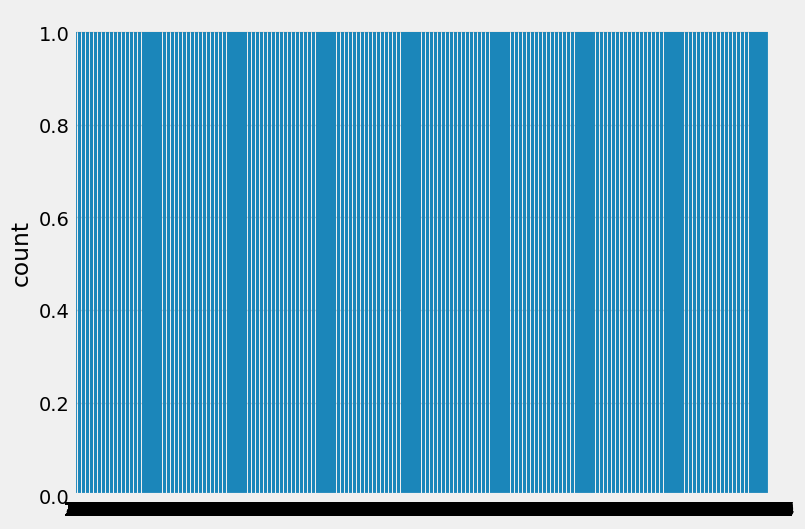

In [340]:
plt.figure (figsize = (8 , 6))
sns.countplot (df2["Labels"])

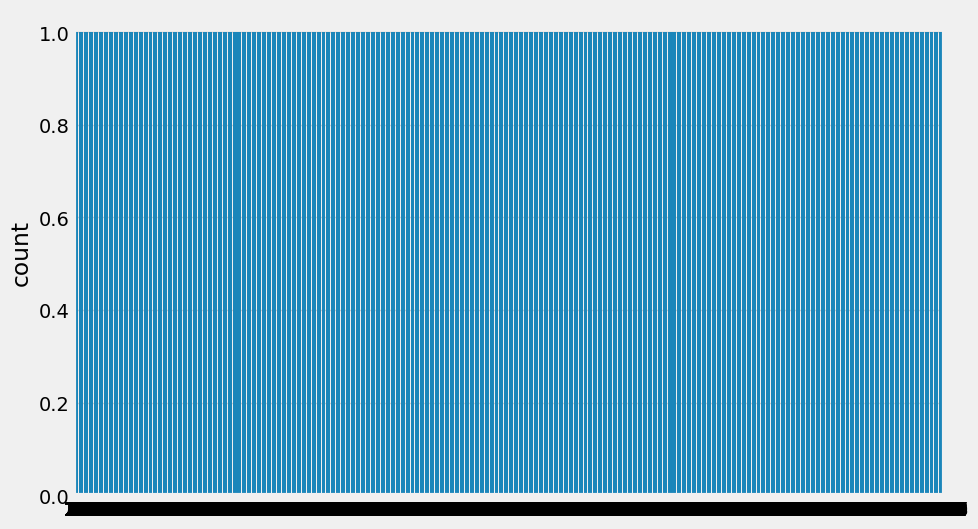

In [281]:
plt.figure(figsize=(10, 6))  # Aumentar el tamaño del gráfico
sns.countplot(df2["Labels"])
plt.xticks(rotation=0)  # Asegurarse de que las etiquetas del eje X estén bien alineadas
plt.show()


In [341]:
#Set number of clusters at initialisation time
k_means = KMeans (n_clusters = 3)

#Run the clustering algorithm
model = k_means.fit (scaled_features)
model

#Generate cluster predictions and store in
y_hat = k_means.predict (scaled_features)

In [282]:
from sklearn import metrics

labels = k_means.labels_
print ("Silhouette score is :" , metrics.silhouette_score (scaled_features, labels, metric = 'euclidean'))
print ("Calinski-Harabasz score is :" , metrics.calinski_harabasz_score (scaled_features, labels))
print ("Davies-Bouldin score is :" , metrics.davies_bouldin_score(scaled_features, labels)) #"cuanto menor es el valor del Índice de Davies-Bouldin, mejor es la calidad del agrupamiento."

Silhouette score is : 0.18269095967436222
Calinski-Harabasz score is : 1559.1236652278722
Davies-Bouldin score is : 1.7596606521634988


Valor: 0.249 (aproximadamente).
Interpretación: El coeficiente de silueta mide cuán similar es un punto de datos a otros en su propio clúster en comparación con otros clústeres. El rango de este coeficiente es de -1 a 1. Un valor cercano a 0.25 indica una calidad de agrupamiento moderada, donde los clústeres están razonablemente separados pero no completamente claros.

Calinski-Harabasz Score:

Valor: 1591.33 (aproximadamente).
Interpretación: También conocido como el "Índice de Varianza", esta métrica evalúa la dispersión dentro de los clústeres en comparación con la dispersión entre clústeres. Cuanto mayor sea este valor, mejor será la calidad del agrupamiento. Un valor elevado como este indica una buena separación entre los clústeres.


Davies-Bouldin Score:

Valor: 1.599 (aproximadamente).
Interpretación: El índice de Davies-Bouldin mide la relación entre la dispersión dentro de los clústeres y la separación entre los clústeres. Cuanto más bajo sea el valor, mejor será el agrupamiento. Un valor de 1.599 sugiere una calidad de agrupamiento decente, aunque puede haber algún grado de superposición o cercanía entre clústeres.

Conclusión:

Silhouette Score indica una separación moderada entre los clústeres.
Calinski-Harabasz Score es bastante alto, lo que sugiere que los clústeres están bien separados.

Davies-Bouldin Score es razonablemente bajo, lo que indica que los clústeres no están demasiado superpuestos.

En conjunto, estas métricas sugieren que el modelo de clustering está funcionando de manera aceptable, con cierta separación entre los clústeres, aunque podría haber espacio para mejorar la cohesión interna de los mismos.



**1. Inertia (Inercia) o Sum of Squared Errors (SSE)**

Descripción: La inercia mide la suma de las distancias al cuadrado entre cada punto de datos y el centroide de su cluster asignado. Es una medida de cuán compactos son los clusters.
Interpretación: Un valor más bajo de inercia indica clusters más compactos, lo que generalmente sugiere una mejor agrupación. Sin embargo, esta métrica tiende a disminuir con un aumento en el número de clusters, por lo que es importante usarla junto con otras métricas.
Uso: Se utiliza comúnmente para encontrar el número óptimo de clusters a través del método del "codo" (elbow method). Se elige un punto en el que agregar más clusters no reduce significativamente la inercia.

**2. Silhouette Score (Índice de Silueta)**

Descripción: El índice de silueta mide la separación y la cohesión de los clusters. Para cada punto, compara la distancia media a los puntos dentro de su propio cluster (cohesión) con la distancia media a los puntos del cluster más cercano (separación).
Interpretación: El valor del índice de silueta varía entre -1 y 1. Un valor cercano a 1 indica que los puntos están bien agrupados dentro de su propio cluster y bien separados de otros clusters. Un valor cercano a 0 sugiere que los puntos están en los límites de los clusters, mientras que un valor negativo indica que los puntos podrían haber sido asignados al cluster equivocado.
Uso: Es una métrica poderosa para evaluar tanto la compactación como la separación de los clusters y ayuda a determinar el número óptimo de clusters.

**3. Davies-Bouldin Index (Índice de Davies-Bouldin)**

Descripción: El índice de Davies-Bouldin evalúa la relación entre la dispersión dentro de los clusters y la distancia entre los clusters. Para cada cluster, se calcula la relación entre la suma de la dispersión intra-cluster y la distancia inter-cluster al cluster más cercano.
Interpretación: Un índice de Davies-Bouldin más bajo indica clusters más compactos y mejor separados, lo cual es deseable.
Uso: Esta métrica es útil para comparar diferentes resultados de clustering y seleccionar el número adecuado de clusters. Es particularmente útil cuando se necesita equilibrar la dispersión y la separación de los clusters.

**4. Calinski-Harabasz Index (Índice de Calinski-Harabasz o Ratio de Varianza)**

Descripción: El índice de Calinski-Harabasz se calcula como la razón entre la dispersión entre clusters y la dispersión dentro de los clusters. Se basa en la idea de que los clusters deberían ser lo más compactos posible (baja varianza intra-cluster) y tan separados como sea posible (alta varianza inter-cluster).
Interpretación: Un valor más alto del índice de Calinski-Harabasz sugiere mejores resultados de clustering, ya que indica que los clusters están más dispersos entre sí y son más compactos en su interior.

Uso: Es una métrica eficiente para evaluar la calidad del clustering, especialmente cuando se comparan diferentes configuraciones del número de clusters.

Conclusión

Cada una de estas métricas ofrece una perspectiva diferente sobre la calidad del clustering realizado por K-means. En la práctica, es recomendable utilizar varias de estas métricas en conjunto para determinar el número óptimo de clusters y evaluar la calidad del modelo de clustering.